Notebook to create the draft versions of the ultimately chosen map subplots for the app

In [2]:
import pandas as pd

# Path to your Parquet gzip file
file_path_11 = '../../1_Data/CLEANED/interventions_dataset.parquet'

# Read the Parquet file into a pandas DataFrame
interventions_dataset = pd.read_parquet(file_path_11, engine='pyarrow')

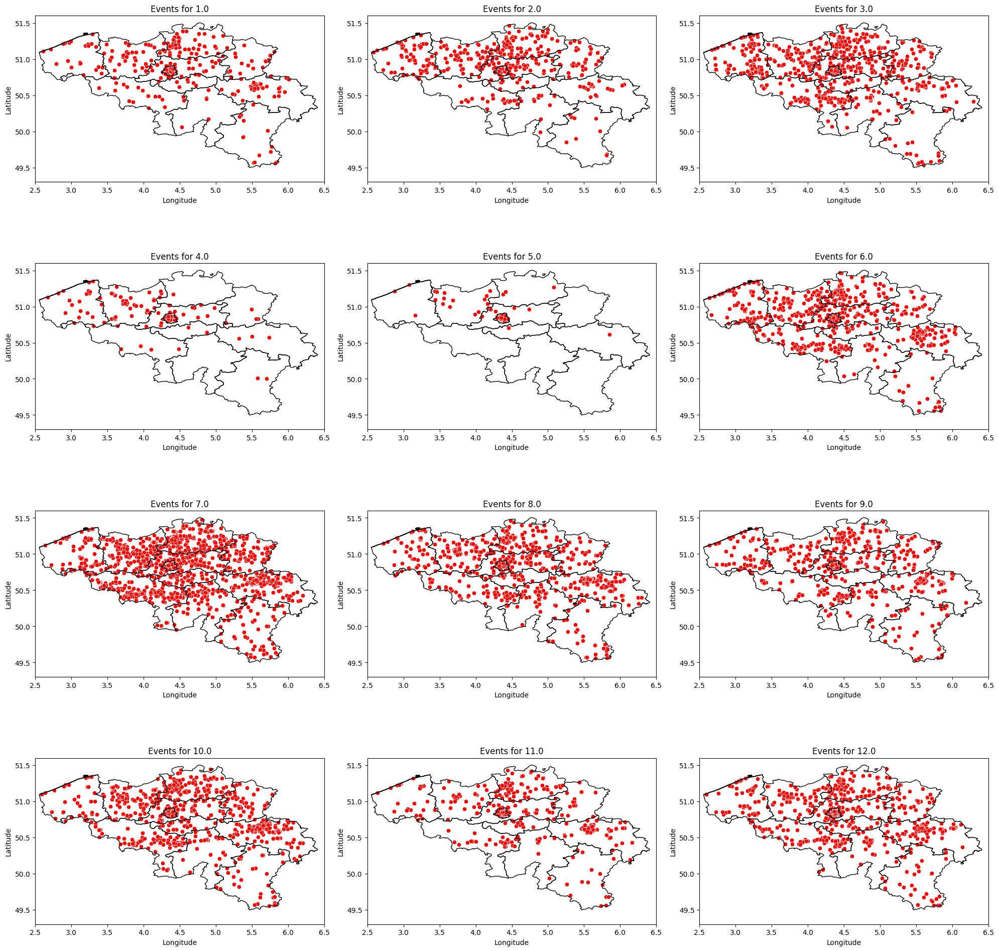

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Group by Month
grouped_by_month = subset.groupby('t0_Month', observed=False)

# Load Belgium shapefile
belgium_shapefile = gpd.read_file('../../App/assets/shapefile_BEL_adm2.shx')  # Replace 'path_to_belgium_shapefile.shp' with actual path

# Create Map Subplots
num_rows = 4  # Adjusted to match the number of months
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20))  # Adjust figsize as needed
axes = axes.flatten()

for i, (month, data) in enumerate(grouped_by_month):
    ax = axes[i]
    # Plot Belgium borders
    belgium_shapefile.boundary.plot(ax=ax, linewidth=1, color='black')
    # Plot data points
    sns.scatterplot(x='longitude_intervention', y='latitude_intervention', data=data, ax=ax, color='red')
    ax.set_title(f'Events for {month}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_aspect('equal', 'box')
    ax.set_xlim(2.5, 6.5)  # Adjust x-axis limits to focus on Belgium
    ax.set_ylim(49.3, 51.6)  # Adjust y-axis limits to focus on Belgium

# Hide empty subplots
for i in range(len(grouped_by_month), num_rows * num_cols):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


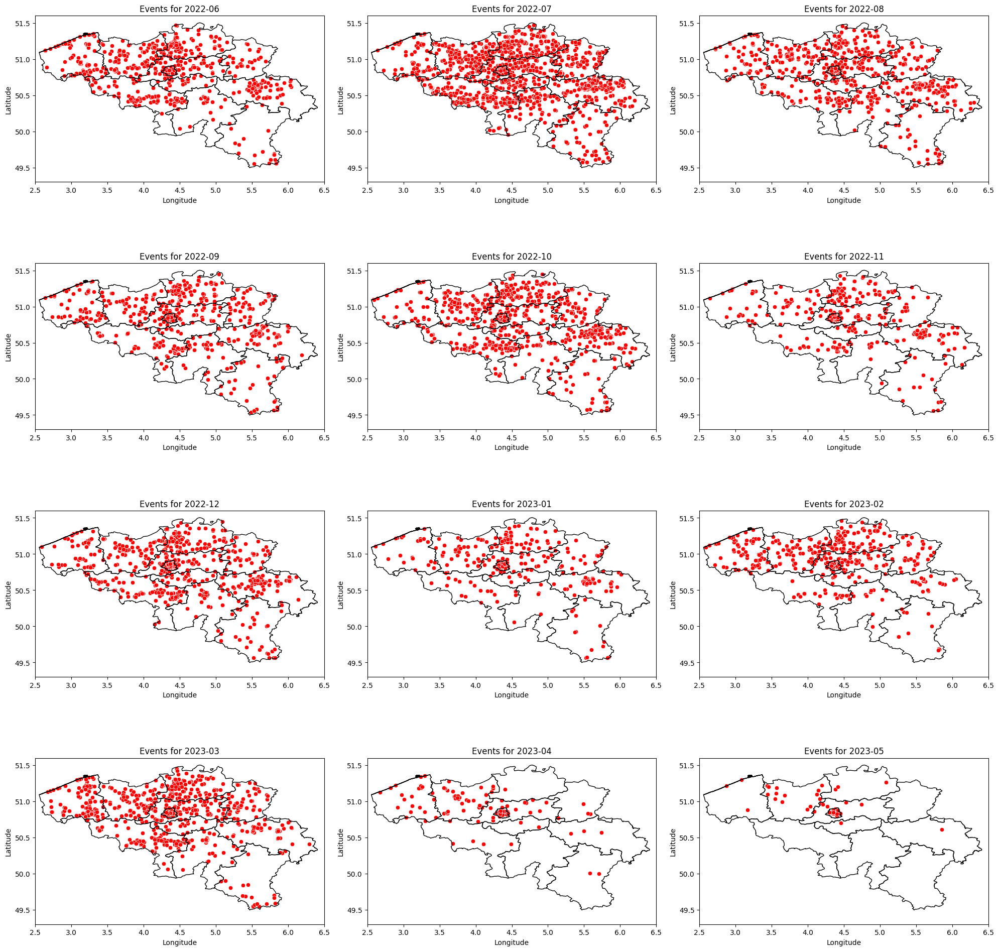

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Group by Month
grouped_by_month = subset.groupby('t0_Month')

# Load Belgium shapefile
belgium_shapefile = gpd.read_file('../../App/assets/shapefile_BEL_adm2.shx')

# Create Map Subplots
num_rows = 4  # Adjusted to match the number of months
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20))  # Adjust figsize as needed
axes = axes.flatten()

for i, (month, data) in enumerate(grouped_by_month):
    ax = axes[i]
    # Plot Belgium borders
    belgium_shapefile.boundary.plot(ax=ax, linewidth=1, color='black')
    # Plot data points
    sns.scatterplot(x='longitude_intervention', y='latitude_intervention', data=data, ax=ax, color='red')
    ax.set_title(f'Events for {month}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_aspect('equal', 'box')
    ax.set_xlim(2.5, 6.5)  # Adjust x-axis limits to focus on Belgium
    ax.set_ylim(49.3, 51.6)  # Adjust y-axis limits to focus on Belgium

# Hide empty subplots
for i in range(len(grouped_by_month), num_rows * num_cols):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [3]:
import plotly.graph_objects as go
import pandas as pd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Filter dataset for the specified timeframe (June 2022 to May 2023)
start_date = pd.Period('2022-06')
end_date = pd.Period('2023-05')
filtered_dataset = subset[(subset['t0_Month'] >= start_date) & (subset['t0_Month'] <= end_date)]

data = []
layout = dict(
    title='Interventions per Month',
    # showlegend = False,
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

months = filtered_dataset['t0_Month'].unique()

for i in range(len(months)):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['latitude_intervention'])
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(months[i]),
            marker=dict(
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[-78],  # Assuming a fixed longitude for the marker
            lat=[47],  # Assuming a fixed latitude for the marker
            geo=geo_key,
            text=[str(months[i])],
            mode='text',
        )
    )
    layout[geo_key] = dict(
        scope='world',  # You might want to adjust the scope based on your data
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=False,
        domain=dict(x=[], y=[]),
        subunitcolor="rgb(255, 255, 255)",
    )

# Update the layout for subplots
z = 0
COLS = 3
ROWS = 4
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 42:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()


In [39]:
import plotly.graph_objects as go
import pandas as pd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Filter dataset for the specified timeframe (June 2022 to May 2023)
start_date = pd.Period('2022-06')
end_date = pd.Period('2023-05')
filtered_dataset = subset[(subset['t0_Month'] >= start_date) & (subset['t0_Month'] <= end_date)]

data = []
layout = dict(
    title='Interventions per Month',
    # showlegend = False,
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

months = filtered_dataset['t0_Month'].unique()

for i in range(len(months)):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['latitude_intervention'])
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(months[i]),
            marker=dict(
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[4.4699+2],  # Longitude of Belgium's center
            lat=[50.5039],  # Latitude of Belgium's center
            geo=geo_key,
            text=[str(months[i])],
            mode='text',
        )
    )
    layout[geo_key] = dict(
        scope='europe',  # Zoom in on Europe
        center=dict(lon=4.4699, lat=50.5039),  # Center around Belgium
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(204, 204, 204)',  # Country border color
        subunitcolor="rgb(255, 255, 255)",
        domain=dict(x=[], y=[]),  # Initialize the domain key
    )

# Update the layout for subplots
z = 0
COLS = 3
ROWS = 4
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 11:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()


In [57]:
import plotly.graph_objects as go
import pandas as pd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Filter dataset for the specified timeframe (June 2022 to May 2023)
start_date = pd.Period('2022-06')
end_date = pd.Period('2023-05')
filtered_dataset = subset[(subset['t0_Month'] >= start_date) & (subset['t0_Month'] <= end_date)]

data = []
layout = dict(
    title='Interventions per Month',
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

months = filtered_dataset['t0_Month'].unique()

for i in range(len(months)):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['latitude_intervention'])
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(months[i]),
            marker=dict(
                size = 2,
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[4.4699],  # Longitude of Belgium's center
            lat=[50.5039+1.5],  # Latitude of Belgium's center
            geo=geo_key,
            text=[str(months[i])],
            mode='text'
        )
    )
    layout[geo_key] = dict(
        scope='europe',
        center=dict(lon=4.4699, lat=50.5039),  # Center around Belgium
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(204, 204, 204)',  # Country border color
        subunitcolor="rgb(255, 255, 255)",
        projection=dict(
            type='mercator',
            scale=20  # Adjust scale for zoom level
        ),
        domain=dict(x=[], y=[]),  # Initialize the domain key
    )

# Update the layout for subplots
z = 0
COLS = 3
ROWS = 4
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 11:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()


In [67]:
import plotly.graph_objects as go
import pandas as pd
import geopandas as gpd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Filter dataset for the specified timeframe (June 2022 to May 2023)
start_date = pd.Period('2022-06')
end_date = pd.Period('2023-05')
filtered_dataset = subset[(subset['t0_Month'] >= start_date) & (subset['t0_Month'] <= end_date)]

data = []
layout = dict(
    title='Interventions per Month',
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

months = list(filtered_dataset['t0_Month'].unique())
months.sort()  # Ensure the months are sorted correctly

for i in range(len(months)):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['latitude_intervention'])
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(months[i]),
            marker=dict(
                size=2,
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[4.4699],
            lat=[50.5039 + 1.5],
            geo=geo_key,
            text=[str(months[i])],
            mode='text'
        )
    )
    layout[geo_key] = dict(
        scope='europe',
        center=dict(lon=4.4699, lat=50.5039),
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(204, 204, 204)',
        subunitcolor="rgb(255, 255, 255)",
        showsubunits=True,
        subunitwidth=2,
        projection=dict(
            type='mercator',
            scale=20  # Adjust scale for zoom level
        ),
        domain=dict(x=[], y=[]),  # Initialize the domain key
    )

# Adding province boundaries
shapefile_path = '../../App/assets/shapefile_BEL_adm2.shp'
gdf = gpd.read_file(shapefile_path)
for geom in gdf['geometry']:
    if geom.geom_type == 'Polygon':
        x, y = geom.exterior.xy
        data.append(
            dict(
                type='scattergeo',
                mode='lines',
                lon=list(x),
                lat=list(y),
                line=dict(width=1, color='black'),
                geo='geo',
                showlegend=False
            )
        )
    elif geom.geom_type == 'MultiPolygon':
        for polygon in geom.geoms:
            x, y = polygon.exterior.xy
            data.append(
                dict(
                    type='scattergeo',
                    mode='lines',
                    lon=list(x),
                    lat=list(y),
                    line=dict(width=1, color='black'),
                    geo='geo',
                    showlegend=False
                )
            )

# Update the layout for subplots
z = 0
COLS = 3
ROWS = 4
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 11:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()


In [7]:
import plotly.graph_objects as go
import pandas as pd
import geopandas as gpd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract month and year from 't0' column
subset['t0_Month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

# Filter dataset for the specified timeframe (June 2022 to May 2023)
start_date = pd.Period('2022-06')
end_date = pd.Period('2023-05')
filtered_dataset = subset[(subset['t0_Month'] >= start_date) & (subset['t0_Month'] <= end_date)]

data = []
layout = dict(
    title='Interventions per Month',
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

months = list(filtered_dataset['t0_Month'].unique())
months.sort()  # Ensure the months are sorted correctly

for i in range(len(months)):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['t0_Month'] == months[i]]['latitude_intervention'])
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(months[i]),
            marker=dict(
                size=2,
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[4.4699],
            lat=[50.5039 + 1.5],
            geo=geo_key,
            text=[str(months[i])],
            mode='text'
        )
    )
    layout[geo_key] = dict(
        scope='europe',
        center=dict(lon=4.4699, lat=50.5039),
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(204, 204, 204)',
        subunitcolor="rgb(255, 255, 255)",
        showsubunits=True,
        subunitwidth=2,
        projection=dict(
            type='mercator',
            scale=20  # Adjust scale for zoom level
        ),
        domain=dict(x=[], y=[]),  # Initialize the domain key
    )

    # Adding province boundaries
    shapefile_path = '../../App/assets/shapefile_BEL_adm2.shp'
    gdf = gpd.read_file(shapefile_path)
    for geom in gdf['geometry']:
        if geom.geom_type == 'Polygon':
            x, y = geom.exterior.xy
            data.append(
                dict(
                    type='scattergeo',
                    mode='lines',
                    lon=list(x),
                    lat=list(y),
                    line=dict(width=1, color='black'),
                    geo=geo_key,
                    showlegend=False
                )
            )
        elif geom.geom_type == 'MultiPolygon':
            for polygon in geom.geoms:
                x, y = polygon.exterior.xy
                data.append(
                    dict(
                        type='scattergeo',
                        mode='lines',
                        lon=list(x),
                        lat=list(y),
                        line=dict(width=1, color='black'),
                        geo=geo_key,
                        showlegend=False
                    )
                )

# Update the layout for subplots
z = 0
COLS = 6
ROWS = 2
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 11:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()


In [5]:
import plotly.graph_objects as go
import pandas as pd
import geopandas as gpd

# Subset the Data for event type 'P080 - COVID-19'
subset = interventions_dataset[interventions_dataset['eventtype_trip'] == 'P080 - COVID-19'].copy()

# Extract year and month from 't0' column
subset['year_month'] = pd.to_datetime(subset['t0']).dt.to_period('M')

data = []
layout = dict(
    title='Interventions per Year-Month',
    autosize=False,
    width=1000,
    height=900,
    hovermode=False,
    legend=dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font=dict(size=11),
    )
)

year_months = list(filtered_dataset['year_month'].unique())
year_months.sort()  # Ensure the year-months are sorted correctly

for i, year_month in enumerate(year_months):
    geo_key = 'geo' + str(i + 1) if i != 0 else 'geo'
    lons = list(filtered_dataset[filtered_dataset['year_month'] == year_month]['longitude_intervention'])
    lats = list(filtered_dataset[filtered_dataset['year_month'] == year_month]['latitude_intervention'])
    
    # Intervention data
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=lons,
            lat=lats,
            geo=geo_key,
            name=str(year_month),
            marker=dict(
                size=2,
                color="rgb(0, 0, 255)",
                opacity=0.5
            )
        )
    )
    # Year-Month markers
    data.append(
        dict(
            type='scattergeo',
            showlegend=False,
            lon=[4.4699],
            lat=[50.5039 + 1.5],
            geo=geo_key,
            text=[str(year_month)],
            mode='text'
        )
    )
    layout[geo_key] = dict(
        scope='europe',
        center=dict(lon=4.4699, lat=50.5039),
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(204, 204, 204)',
        subunitcolor="rgb(255, 255, 255)",
        showsubunits=True,
        subunitwidth=2,
        projection=dict(
            type='mercator',
            scale=20  # Adjust scale for zoom level
        ),
        domain=dict(x=[], y=[]),  # Initialize the domain key
    )

    # Adding province boundaries
    shapefile_path = '../../App/assets/shapefile_BEL_adm2.shp'
    gdf = gpd.read_file(shapefile_path)
    for geom in gdf['geometry']:
        if geom.geom_type == 'Polygon':
            x, y = geom.exterior.xy
            data.append(
                dict(
                    type='scattergeo',
                    mode='lines',
                    lon=list(x),
                    lat=list(y),
                    line=dict(width=1, color='black'),
                    geo=geo_key,
                    showlegend=False
                )
            )
        elif geom.geom_type == 'MultiPolygon':
            for polygon in geom.geoms:
                x, y = polygon.exterior.xy
                data.append(
                    dict(
                        type='scattergeo',
                        mode='lines',
                        lon=list(x),
                        lat=list(y),
                        line=dict(width=1, color='black'),
                        geo=geo_key,
                        showlegend=False
                    )
                )

# Update the layout for subplots
z = 0
COLS = 6
ROWS = 2
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo' + str(z + 1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x) / float(COLS), float(x + 1) / float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y) / float(ROWS), float(y + 1) / float(ROWS)]
        z = z + 1
        if z > 11:
            break

# Create the figure
fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)

# Show the figure
fig.show()
